# Model inference

Here, we show how to load an already trained/fine-tuned model and a dataset and then do model inference.

In [1]:
# solve issue with autocomplete
%config Completer.use_jedi = False

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import glob
import matplotlib.pyplot as plt
import os
from scipy.interpolate import griddata

## Load patches and add metadata

In [3]:
from mapreader import load_patches

In [4]:
my_maps = load_patches("./maps/slice_50_50/*101168192*PNG", 
                      parent_paths="./maps/map_101168192.png")

path2metadata = "./maps/metadata.csv"
my_maps.add_metadata(metadata=path2metadata)

In [5]:
# Calculate coordinates and some pixel stats
my_maps.add_center_coord()
my_maps.calc_pixel_stats()

[INFO] Add center coordinates, tree level: child
[INFO] Add coord-increments, tree level: parent
[INFO] Add shape, tree level: parent
----------
[INFO] calculate pixel stats for image: map_101168192.png


In [6]:
parent_df, patch_df = my_maps.convertImages()
patch_df.head()

,parent_id,image_path,min_x,min_y,max_x,max_y,center_lon,center_lat,mean_pixel_R,mean_pixel_G,mean_pixel_B,mean_pixel_RGB,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_RGB,std_pixel_A
patch-1400-2550-1450-2600-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1400,2550,1450,2600,-5.326557,51.901433,0.723106,0.712773,0.654930,0.696936,1.000000,0.170652,0.177379,0.168536,0.174823,0.000000
patch-2650-700-2700-750-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,2650,700,2700,750,-5.218959,52.000251,0.931724,0.926521,0.863620,0.907288,1.000000,0.009059,0.009537,0.010698,0.032462,0.000000
patch-1700-1650-1750-1700-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1700,1650,1750,1700,-5.300733,51.949506,0.922607,0.917197,0.860330,0.900044,1.000000,0.047664,0.049935,0.049710,0.056618,0.000000
patch-2000-3450-2050-3500-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,2000,3450,2050,3500,-5.274910,51.853359,0.788237,0.780951,0.720278,0.763155,0.999995,0.117723,0.122318,0.120087,0.123862,0.000136
patch-4800-250-4850-300-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,4800,250,4850,300,-5.033890,52.024287,0.859427,0.855315,0.793153,0.835965,1.000000,0.128642,0.129813,0.124468,0.131213,0.000000


In [7]:
patch_df.reset_index(names="image_id", inplace=True)
patch_df.head()

,image_id,parent_id,image_path,min_x,min_y,max_x,max_y,center_lon,center_lat,mean_pixel_R,mean_pixel_G,mean_pixel_B,mean_pixel_RGB,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_RGB,std_pixel_A
0,patch-1400-2550-1450-2600-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1400,2550,1450,2600,-5.326557,51.901433,0.723106,0.712773,0.654930,0.696936,1.000000,0.170652,0.177379,0.168536,0.174823,0.000000
1,patch-2650-700-2700-750-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,2650,700,2700,750,-5.218959,52.000251,0.931724,0.926521,0.863620,0.907288,1.000000,0.009059,0.009537,0.010698,0.032462,0.000000
2,patch-1700-1650-1750-1700-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1700,1650,1750,1700,-5.300733,51.949506,0.922607,0.917197,0.860330,0.900044,1.000000,0.047664,0.049935,0.049710,0.056618,0.000000
3,patch-2000-3450-2050-3500-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,2000,3450,2050,3500,-5.274910,51.853359,0.788237,0.780951,0.720278,0.763155,0.999995,0.117723,0.122318,0.120087,0.123862,0.000136
4,patch-4800-250-4850-300-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,4800,250,4850,300,-5.033890,52.024287,0.859427,0.855315,0.793153,0.835965,1.000000,0.128642,0.129813,0.124468,0.131213,0.000000


## Select patches for inference and create dataset

In [12]:
import numpy as np
from torchvision import transforms
from mapreader import patchTorchDataset

In [13]:
resize = 224

#mean values of 'mean_pixel_R/G/B' and 'std_pixel_R/G/B'
normalize_mean = 1 - np.array([0.791667, 0.781116, 0.716220])
normalize_std = 1 - np.array([0.118752, 0.120394, 0.113254])

data_transforms = transforms.Compose([transforms.Resize(resize), 
                                      transforms.ToTensor(), 
                                      transforms.Normalize(normalize_mean,normalize_std)])

In [14]:
patches2infer = patch_df[["image_path"]]
patches2infer

,image_path
0,/Users/rwood/LwM/MapReader/worked_examples/geo...
1,/Users/rwood/LwM/MapReader/worked_examples/geo...
2,/Users/rwood/LwM/MapReader/worked_examples/geo...
3,/Users/rwood/LwM/MapReader/worked_examples/geo...
4,/Users/rwood/LwM/MapReader/worked_examples/geo...
...,...
6882,/Users/rwood/LwM/MapReader/worked_examples/geo...
6883,/Users/rwood/LwM/MapReader/worked_examples/geo...
6884,/Users/rwood/LwM/MapReader/worked_examples/geo...
6885,/Users/rwood/LwM/MapReader/worked_examples/geo...


In [15]:
patches2infer_dataset = patchTorchDataset(patches2infer, 
                                          transform=data_transforms)

## Load your pre-trained model

In [16]:
from mapreader import classifier

In [17]:
my_classifier = classifier()

my_classifier.load("./models_tutorial/checkpoint_8.pkl")

[INFO] Device is set to cpu


In [18]:
batch_size=64

my_classifier.add2dataloader(patches2infer_dataset, 
                            set_name="infer_test", 
                            batch_size=batch_size, 
                            shuffle=False)

[INFO] added 'infer_test' dataloader with 6887 elements.


In [19]:
my_classifier.batch_info(set_name='infer_test')

[INFO] dataset: infer_test
#samples:    6887
#batch size: 64
#batches:    108



## Inference

In [20]:
my_classifier.inference(set_name="infer_test")

2023-03-08 14:46:14 JY5FK6W3K5 [INFO] infer_test -- 11/11 --     64/6887 (  0.9%) -- 
2023-03-08 14:46:23 JY5FK6W3K5 [INFO] infer_test -- 11/11 --    384/6887 (  5.6%) -- 
2023-03-08 14:46:32 JY5FK6W3K5 [INFO] infer_test -- 11/11 --    704/6887 ( 10.2%) -- 
2023-03-08 14:46:40 JY5FK6W3K5 [INFO] infer_test -- 11/11 --   1024/6887 ( 14.9%) -- 
2023-03-08 14:46:48 JY5FK6W3K5 [INFO] infer_test -- 11/11 --   1344/6887 ( 19.5%) -- 
2023-03-08 14:46:57 JY5FK6W3K5 [INFO] infer_test -- 11/11 --   1664/6887 ( 24.2%) -- 
2023-03-08 14:47:05 JY5FK6W3K5 [INFO] infer_test -- 11/11 --   1984/6887 ( 28.8%) -- 
2023-03-08 14:47:14 JY5FK6W3K5 [INFO] infer_test -- 11/11 --   2304/6887 ( 33.5%) -- 
2023-03-08 14:47:22 JY5FK6W3K5 [INFO] infer_test -- 11/11 --   2624/6887 ( 38.1%) -- 
2023-03-08 14:47:31 JY5FK6W3K5 [INFO] infer_test -- 11/11 --   2944/6887 ( 42.7%) -- 
2023-03-08 14:47:39 JY5FK6W3K5 [INFO] infer_test -- 11/11 --   3264/6887 ( 47.4%) -- 
2023-03-08 14:47:48 JY5FK6W3K5 [INFO] infer_test -- 11

In [ ]:
my_classifier.inference_sample_results(num_samples=9, 
                                       class_index=1, 
                                       set_name="infer_test", 
                                       min_conf=80)

## Add model inference outputs to `mapImages`

In [22]:
patches2infer['pred'] = my_classifier.pred_label
patches2infer['conf'] = np.max(np.array(my_classifier.pred_conf), axis=1)
patches2infer

,image_path,pred,conf
0,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0.984632
1,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0.948287
2,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0.947724
3,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0.944184
4,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0.957514
...,...,...,...
6882,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0.941056
6883,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0.938106
6884,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0.966313
6885,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0.957982


In [23]:
patch_df = patch_df.merge(patches2infer, 
                     how="outer",
                     on="image_path",
                     validate="1:1")

In [24]:
patch_df.head()

,image_id,parent_id,image_path,min_x,min_y,max_x,max_y,center_lon,center_lat,mean_pixel_R,...,mean_pixel_B,mean_pixel_RGB,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_RGB,std_pixel_A,pred,conf
0,patch-1400-2550-1450-2600-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1400,2550,1450,2600,-5.326557,51.901433,0.723106,...,0.654930,0.696936,1.000000,0.170652,0.177379,0.168536,0.174823,0.000000,0,0.984632
1,patch-2650-700-2700-750-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,2650,700,2700,750,-5.218959,52.000251,0.931724,...,0.863620,0.907288,1.000000,0.009059,0.009537,0.010698,0.032462,0.000000,0,0.948287
2,patch-1700-1650-1750-1700-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1700,1650,1750,1700,-5.300733,51.949506,0.922607,...,0.860330,0.900044,1.000000,0.047664,0.049935,0.049710,0.056618,0.000000,0,0.947724
3,patch-2000-3450-2050-3500-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,2000,3450,2050,3500,-5.274910,51.853359,0.788237,...,0.720278,0.763155,0.999995,0.117723,0.122318,0.120087,0.123862,0.000136,0,0.944184
4,patch-4800-250-4850-300-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,4800,250,4850,300,-5.033890,52.024287,0.859427,...,0.793153,0.835965,1.000000,0.128642,0.129813,0.124468,0.131213,0.000000,0,0.957514


In [25]:
my_maps.add_metadata(patch_df, tree_level="child")

## Write outputs as CSVs, one file per map sheet

In [26]:
parent_df, patch_df = my_maps.convertImages()
patch_df.head()

,parent_id,image_path,min_x,min_y,max_x,max_y,center_lon,center_lat,mean_pixel_R,mean_pixel_G,...,mean_pixel_RGB,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_RGB,std_pixel_A,image_id,pred,conf
patch-1400-2550-1450-2600-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1400,2550,1450,2600,-5.326557,51.901433,0.723106,0.712773,...,0.696936,1.000000,0.170652,0.177379,0.168536,0.174823,0.000000,patch-1400-2550-1450-2600-#map_101168192.png#.PNG,0,0.984632
patch-2650-700-2700-750-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,2650,700,2700,750,-5.218959,52.000251,0.931724,0.926521,...,0.907288,1.000000,0.009059,0.009537,0.010698,0.032462,0.000000,patch-2650-700-2700-750-#map_101168192.png#.PNG,0,0.948287
patch-1700-1650-1750-1700-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1700,1650,1750,1700,-5.300733,51.949506,0.922607,0.917197,...,0.900044,1.000000,0.047664,0.049935,0.049710,0.056618,0.000000,patch-1700-1650-1750-1700-#map_101168192.png#.PNG,0,0.947724
patch-2000-3450-2050-3500-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,2000,3450,2050,3500,-5.274910,51.853359,0.788237,0.780951,...,0.763155,0.999995,0.117723,0.122318,0.120087,0.123862,0.000136,patch-2000-3450-2050-3500-#map_101168192.png#.PNG,0,0.944184
patch-4800-250-4850-300-#map_101168192.png#.PNG,map_101168192.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,4800,250,4850,300,-5.033890,52.024287,0.859427,0.855315,...,0.835965,1.000000,0.128642,0.129813,0.124468,0.131213,0.000000,patch-4800-250-4850-300-#map_101168192.png#.PNG,0,0.957514


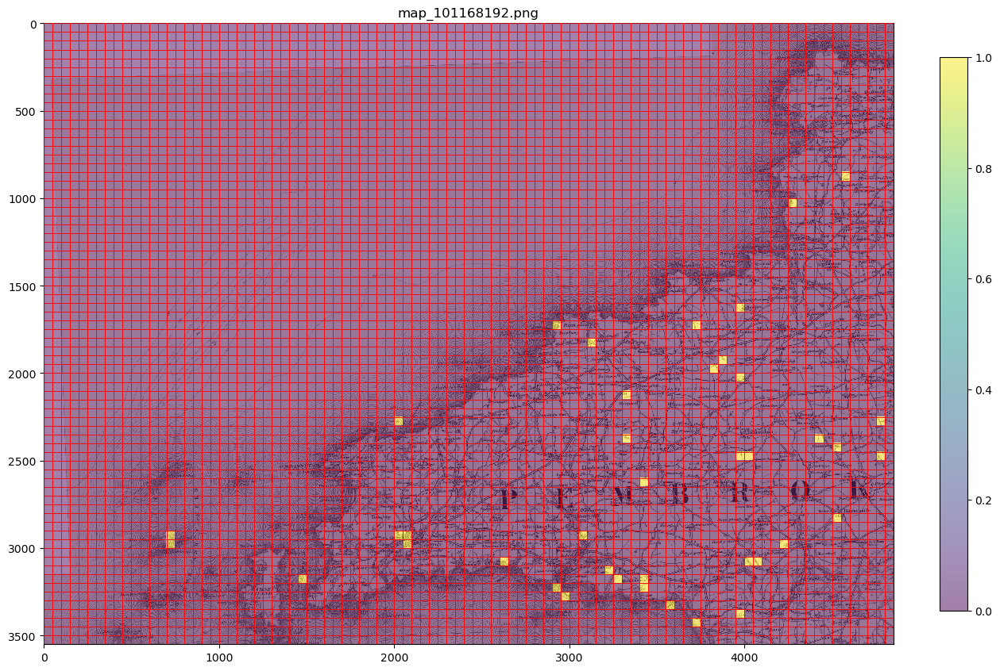

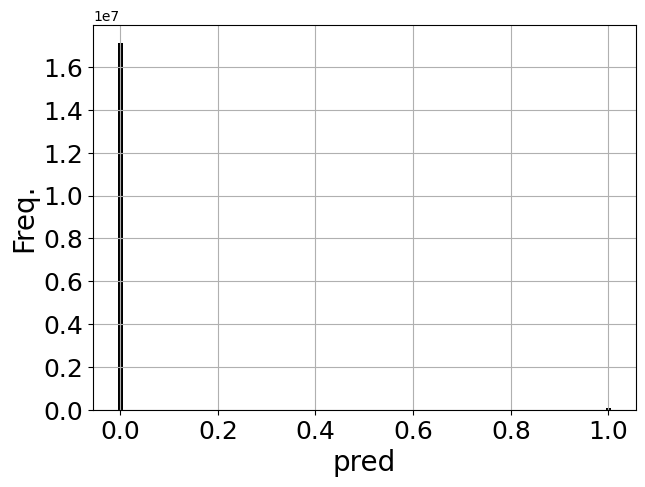

In [28]:
parent_list=my_maps.list_parents()

my_maps.show_par(parent_list[0], 
                value="pred",
                border=True,
                plot_parent=True,
                vmin=0, vmax=1,
                figsize=(15, 15),
                alpha=0.5, 
                colorbar="viridis")

In [31]:
rs_patch_df=patch_df[patch_df['pred']==1]

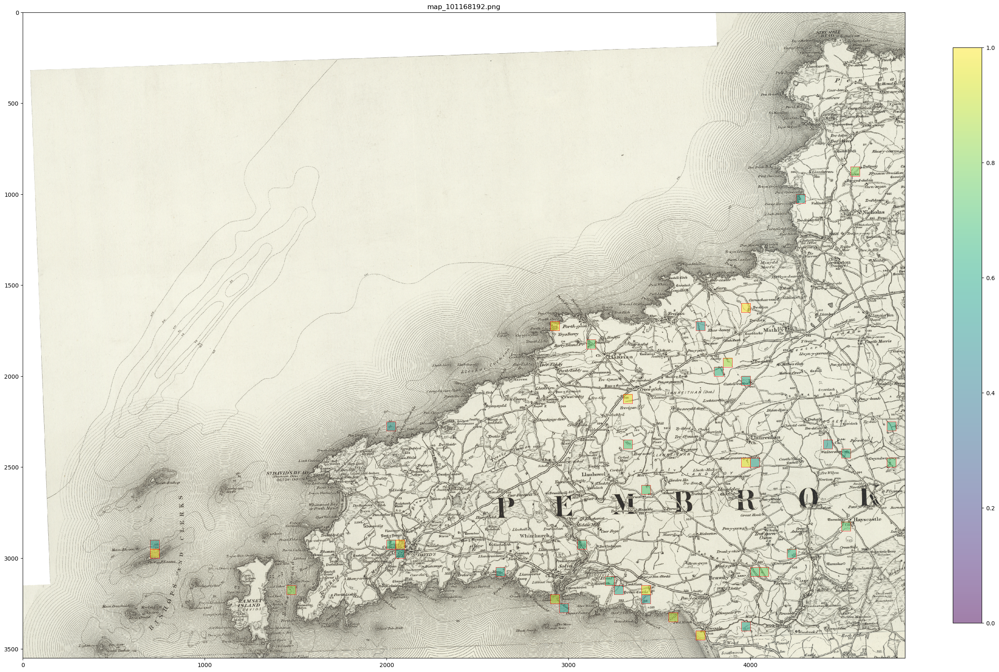

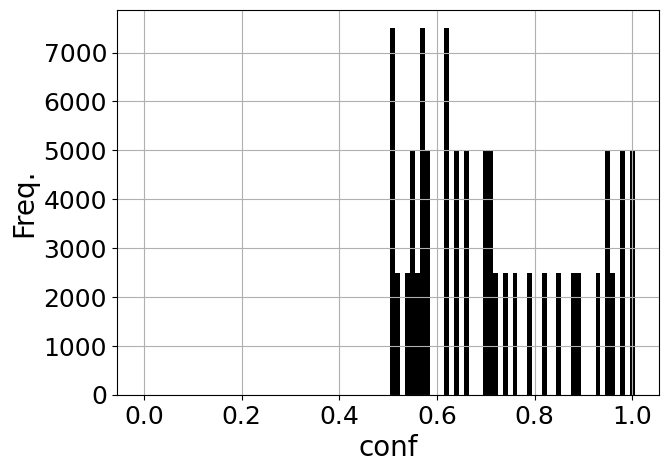

In [53]:
my_maps.show(rs_patch_df['image_id'].to_list(), 
             value='conf',
             border=True,
             plot_parent=True,
             vmin=0, 
             vmax=1,
             figsize=(30,30),
             alpha=0.5,
             colorbar="viridis",
            )
